##### SEGMENTACION DE IMAGEN

In [87]:
#Si queremos que las imágenes sean mostradas en una ventana emergente quitar el inline
%matplotlib inline
# OpenCV-Python utiliza NumPy para el manejo de imágenes
import numpy as np
# cv2 es el módulo python para acceder a OpenCV 
import cv2 as cv
# Usamos las poderosas herramientas de graficación de matplotlib para mostrar imágenes, perfiles, histogramas, etc
import matplotlib.pyplot as plt

In [88]:
# Cargamos las imagenes
segmentacion = cv.imread('C:/Users\juana\OneDrive\Documentos\IA\CEIA\VC1\Material_TPs\TP1/segmentacion.png')
imgRGB = cv.cvtColor(segmentacion, cv.COLOR_BGR2RGB)
print(imgRGB.shape)

(628, 953, 3)


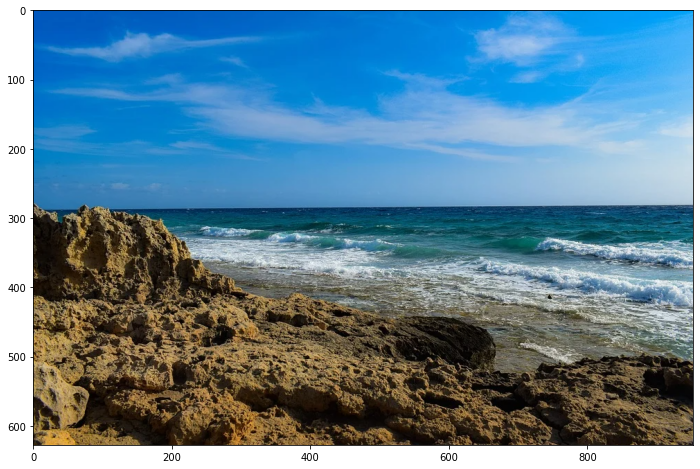

In [89]:
# Ploteamos las imagenes
plt.figure(1,figsize=(20,8))
plt.imshow(imgRGB)

In [5]:
# Separamos la imagen por canal
imgRGB_r, imgRGB_g, imgRGB_b = cv.split(imgRGB)

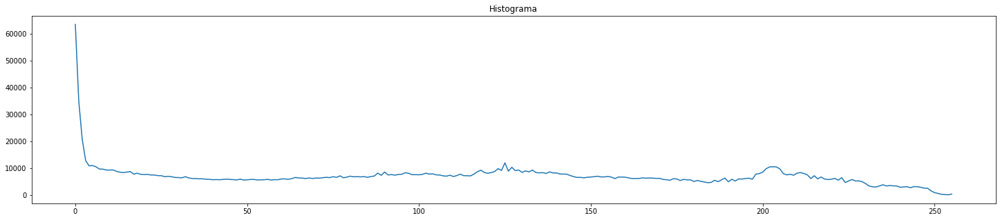

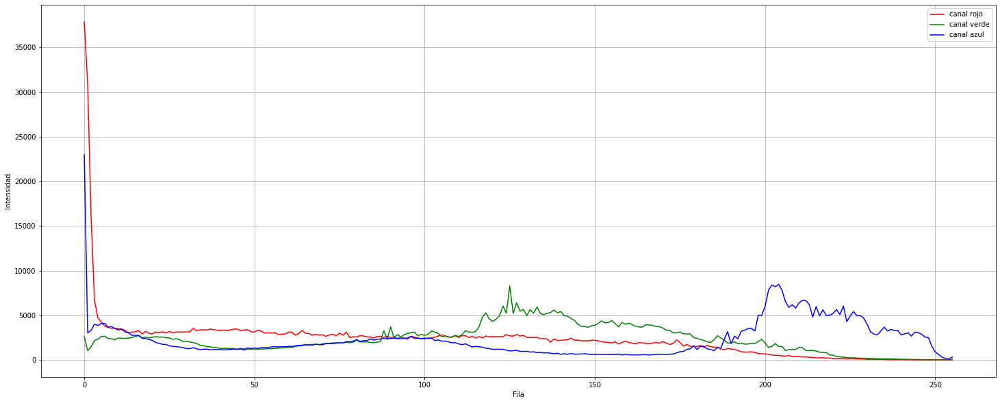

In [136]:
# Ploteamos el histogrma de la imagen original
# Tomamos 256 bins para el histograma
hist,bins = np.histogram(imgRGB.ravel(),256,[0,256])

plt.figure(3,figsize=(25,5))
plt.title('Histograma')
plt.plot(hist)

# Ploteamos el histogrma de cada uno de los canales
# Tomamos 256 bins para el histograma
hist1,bins1 = np.histogram(imgRGB_r.ravel(),256,[0,256])
hist2,bins2 = np.histogram(imgRGB_g.ravel(),256,[0,256])
hist3,bins3 = np.histogram(imgRGB_b.ravel(),256,[0,256])

plt.figure(2,figsize=(25,10))
plt.plot(hist1, color='r', label='canal rojo')
plt.plot(hist2, color='g', label='canal verde')
plt.plot(hist3, color='b', label='canal azul')
plt.xlabel('Fila')
plt.ylabel('Intensidad')
plt.grid()
plt.legend()
plt.show()

### Segmentacion por histograma

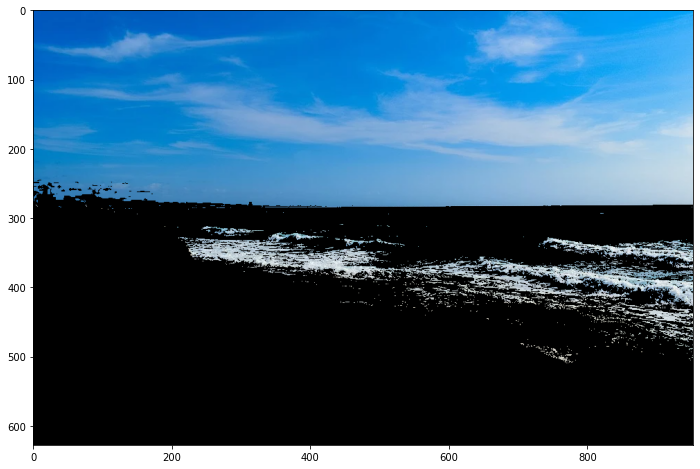

In [80]:
# Planteamos una segmentacion por histograma del canal azul
ancho, largo, canales = imgRGB.shape
umbral_blue_inf = 180
umbral_blue_sup = 255

blue_hist = np.zeros([ancho, largo, canales])
blue_hist = blue_hist.astype(np.uint8)
for i in range(ancho):
    for j in range(largo):
        if imgRGB_b[i,j] >= umbral_blue_inf and imgRGB_b[i,j] <= umbral_blue_sup:
            blue_hist[i,j,:] = imgRGB[i,j,:]
plt.figure(1,figsize=(20,8))
plt.imshow(blue_hist)

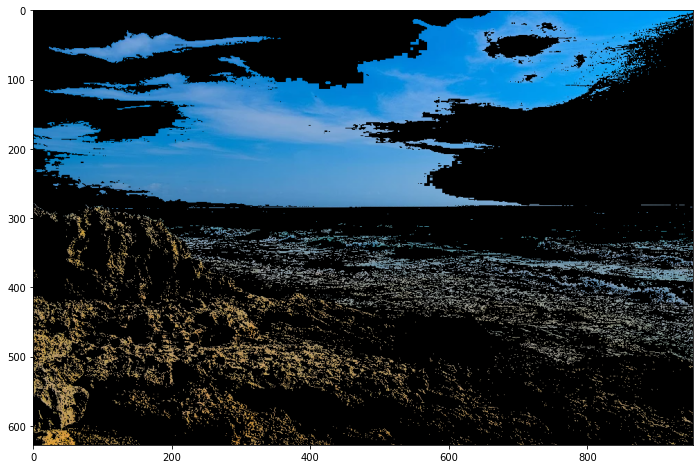

In [83]:
# Planteamos una segmentacion por histograma del canal verde
ancho, largo, canales = imgRGB.shape
umbral_green_inf = 130
umbral_green_sup = 170

green_hist = np.zeros([ancho, largo, canales])
green_hist = green_hist.astype(np.uint8)
for i in range(ancho):
    for j in range(largo):
        if imgRGB_g[i,j] >= umbral_green_inf and imgRGB_g[i,j] <= umbral_green_sup:
            green_hist[i,j,:] = imgRGB[i,j,:]
plt.figure(1,figsize=(20,8))
plt.imshow(green_hist)

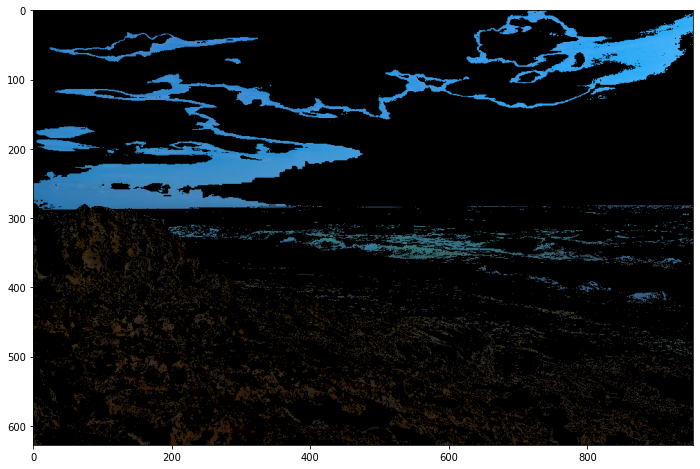

In [84]:
# Planteamos una segmentacion por histograma del canal rojo
ancho, largo, canales = imgRGB.shape
umbral_red_inf = 40
umbral_red_sup = 70

red_hist = np.zeros([ancho, largo, canales])
red_hist = red_hist.astype(np.uint8)
for i in range(ancho):
    for j in range(largo):
        if imgRGB_r[i,j] >= umbral_red_inf and imgRGB_r[i,j] <= umbral_red_sup:
            red_hist[i,j,:] = imgRGB[i,j,:]
plt.figure(1,figsize=(20,8))
plt.imshow(red_hist)

Observamos que el cielo es posible segmentarlo a traves del canal azul, pero la tierra y el agua nos es posible hacerla a partir del histograma por canal. Dada esta situacion, vamos a plantear otra estrategia de segmentacion por un metodo de desvio estandar.

### Segmentacion por Modelo Estadistico

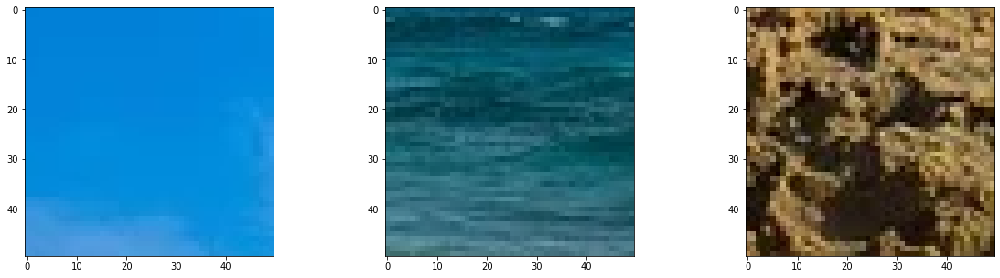

In [95]:
# Tomamos una muestra del cielo, una de agua y una de tierra
cielo = imgRGB[100:150,450:500,:]
agua = imgRGB[300:350,600:650,:]
tierra = imgRGB[500:550,250:300,:]
plt.figure(5,figsize=(20,5))
plt.subplot(1,3,1)
plt.imshow(cielo)
plt.subplot(1,3,2)
plt.imshow(agua)
plt.subplot(1,3,3)
plt.imshow(tierra)
plt.show()

In [96]:
# Calculamos la media y el desvio estandar una muestra del cielo, una de agua y una de tierra
cielo_mean, cielo_std = cv.meanStdDev(cielo)
agua_mean, agua_std = cv.meanStdDev(agua)
tierra_mean, tierra_std = cv.meanStdDev(tierra)

print(cielo_mean.flatten())
print(cielo_std.flatten())
print(agua_mean.flatten())
print(agua_std.flatten())
print(tierra_mean.flatten())
print(tierra_std.flatten())

[ 10.576  138.0148 218.7668]
[19.88785117  7.23597823  2.65940177]
[ 27.6968  93.1972 107.9832]
[24.6053992  19.92848996 20.06026216]
[102.9104  81.19    48.7608]
[52.9123121  47.75155181 36.56330925]


<function matplotlib.pyplot.show(close=None, block=None)>

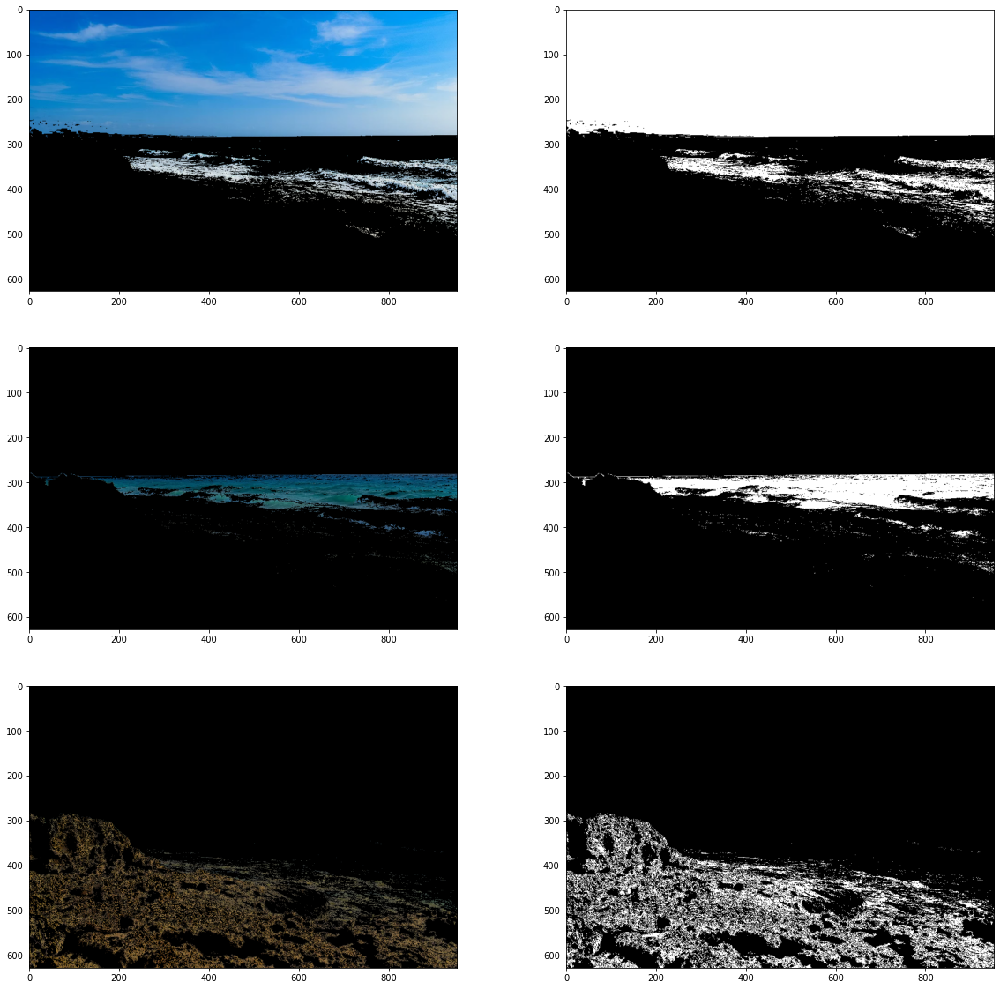

In [97]:
# Pintamos de blanco los puntos que estén cerca de color_mean en un radio menor que "X" sigmas segun corresponda. Los valores de "X" los obtuvimos haciendo
# un barrido debajo y observando los resultados
#-----------------------------------------------------------------------------------------
mask_cielo = cv.inRange(imgRGB, cielo_mean-cielo_std*15,  cielo_mean+cielo_std*15)
cielo_segmentada = cv.bitwise_and(imgRGB, imgRGB, mask=mask_cielo)
mask_agua = cv.inRange(imgRGB, agua_mean-agua_std*2,  agua_mean+agua_std*2)
agua_segmentada = cv.bitwise_and(imgRGB, imgRGB, mask=mask_agua)
mask_tierra = cv.inRange(imgRGB, tierra_mean-tierra_std*1,  tierra_mean+tierra_std*1)
tierra_segmentada = cv.bitwise_and(imgRGB, imgRGB, mask=mask_tierra)

plt.figure(3,figsize=(20,20))

plt.subplot(3,2,1)
plt.imshow(cielo_segmentada)
plt.subplot(3,2,2)
plt.imshow(mask_cielo,cmap='gray')

plt.subplot(3,2,3)
plt.imshow(agua_segmentada)
plt.subplot(3,2,4)
plt.imshow(mask_agua,cmap='gray')

plt.subplot(3,2,5)
plt.imshow(tierra_segmentada)
plt.subplot(3,2,6)
plt.imshow(mask_tierra,cmap='gray')

plt.show

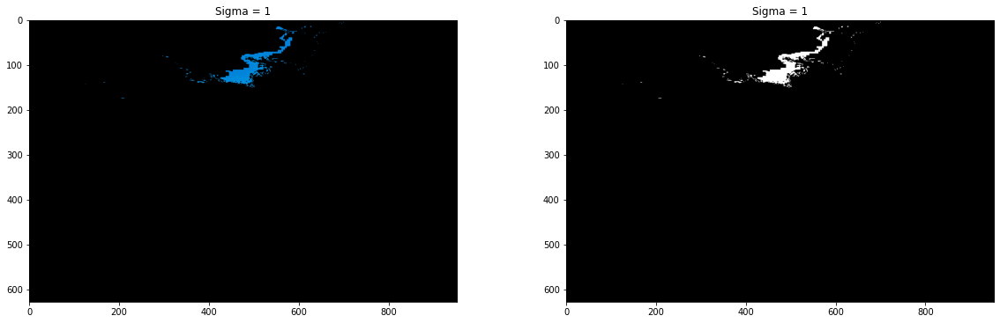

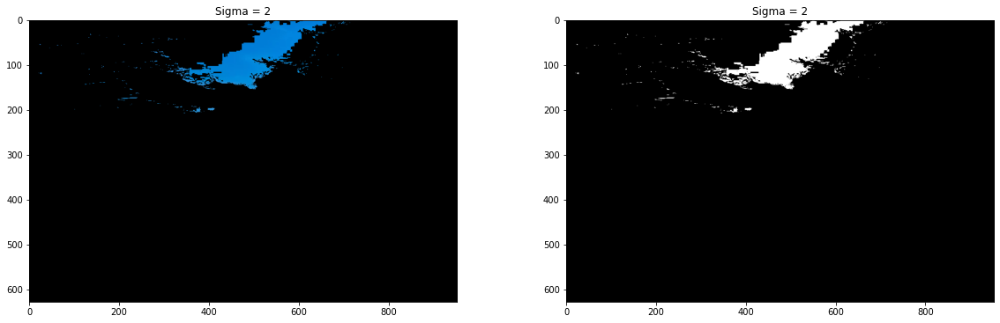

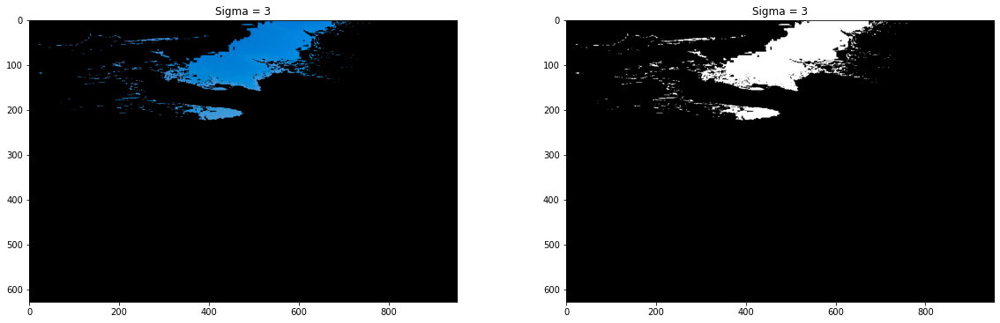

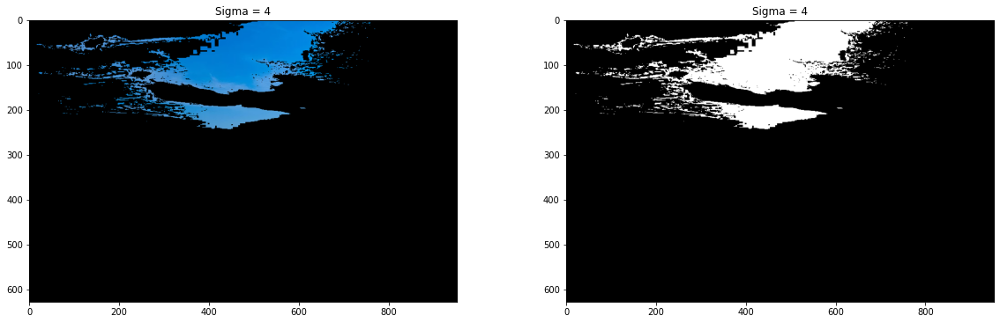

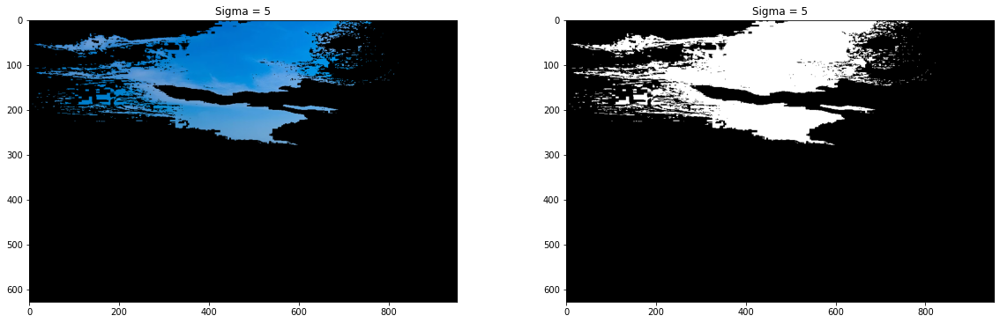

...

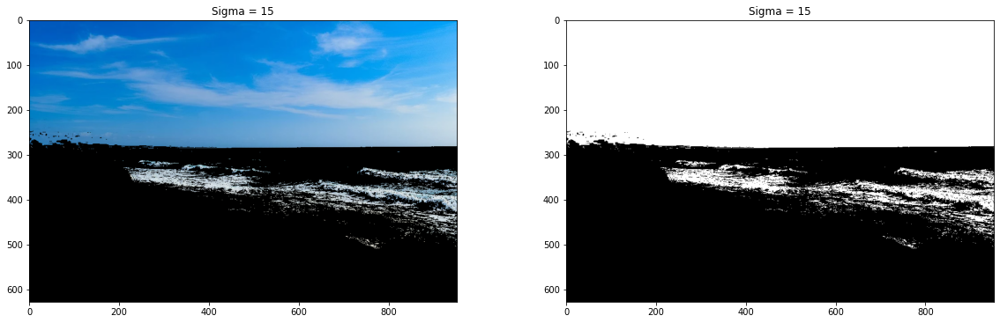

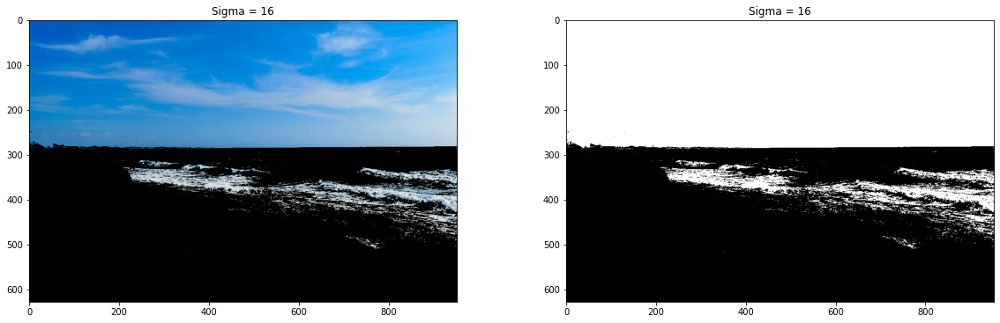

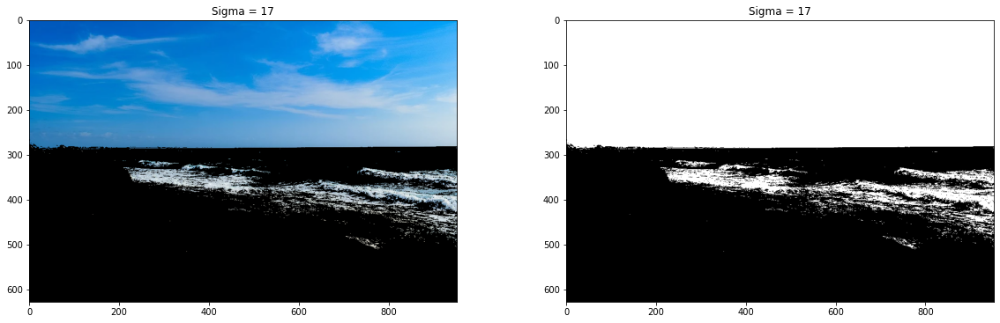

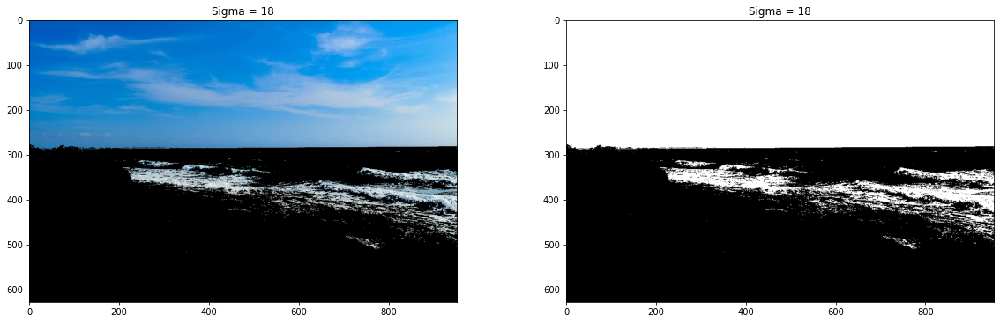

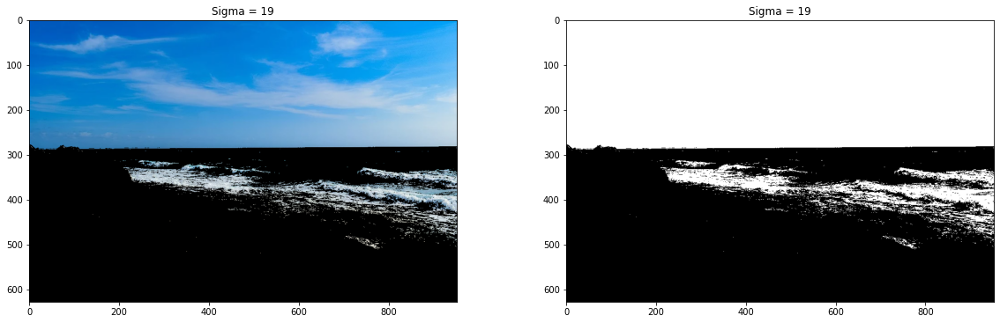

In [108]:
# Segmentacion del cielo
# Hacemos un barrido con diferentes sigmas y observamos los resultados
#---------------------------------------------------------------------
for i in range(1,20):
    mask_cielo = cv.inRange(imgRGB, cielo_mean-cielo_std*i,  cielo_mean+cielo_std*i)
    cielo_segmentada = cv.bitwise_and(imgRGB, imgRGB, mask=mask_cielo)

    plt.figure(i,figsize=(20,20))
    plt.subplot(3,2,1)
    plt.title("Sigma = {}".format(i))
    plt.imshow(cielo_segmentada)
    plt.subplot(3,2,2)
    plt.imshow(mask_cielo,cmap='gray')
    plt.title("Sigma = {}".format(i))
    plt.show

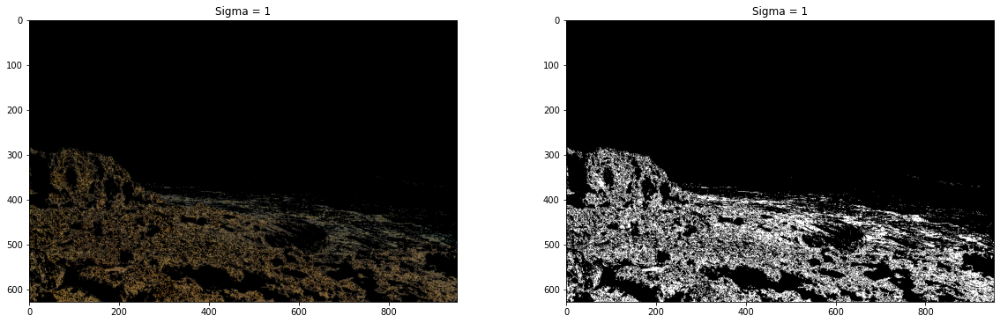

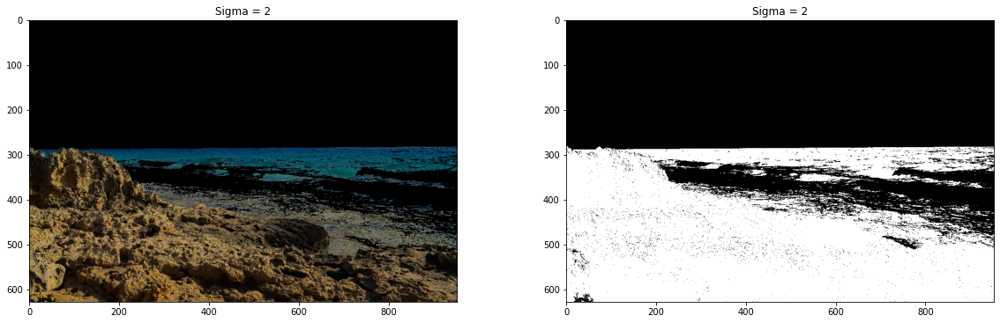

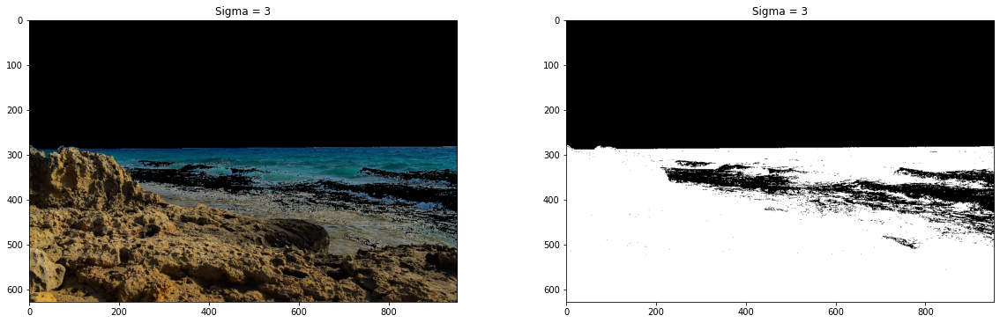

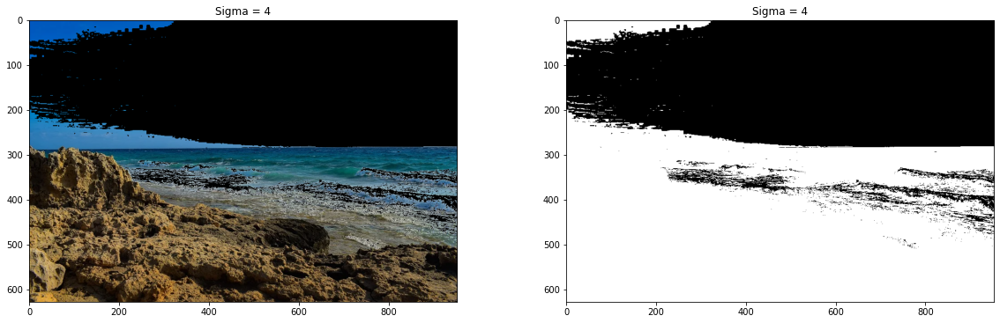

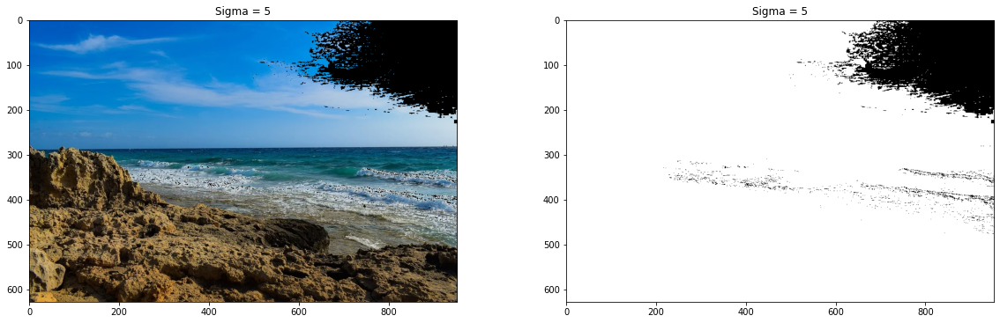

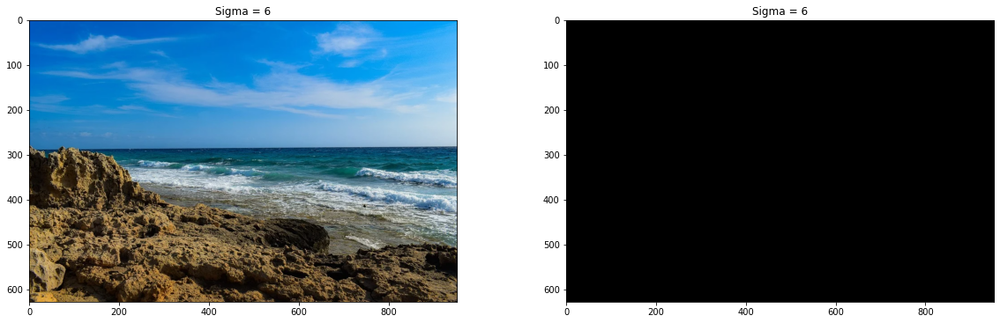

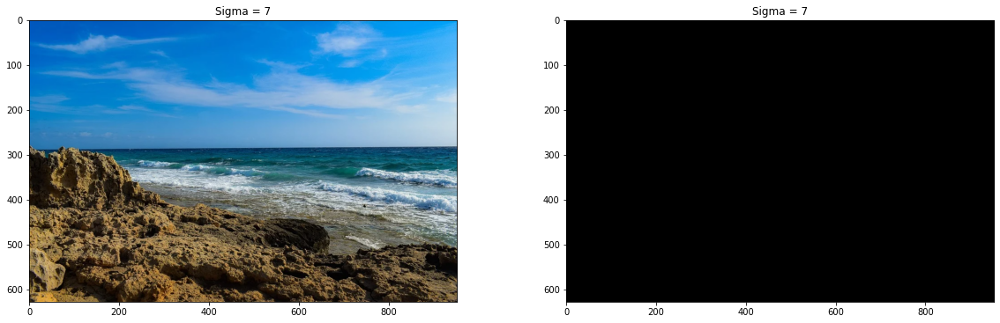

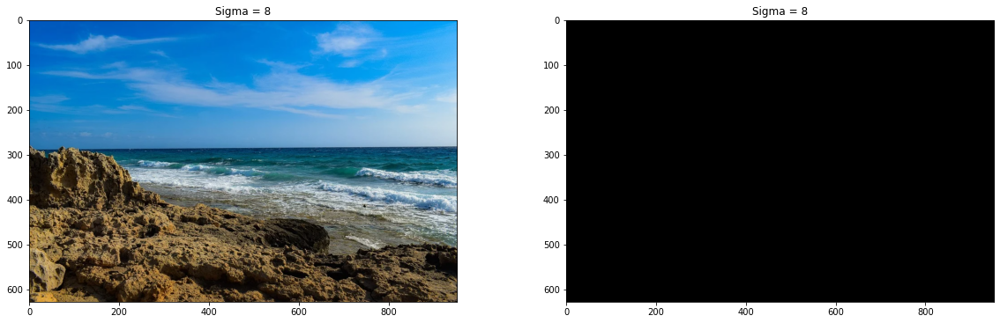

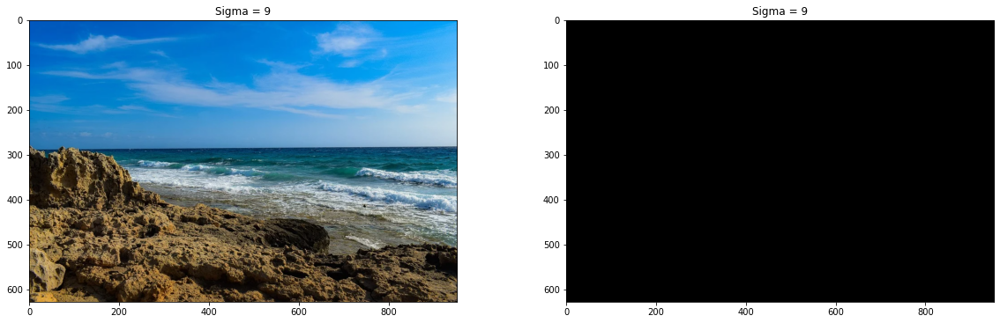

In [107]:
# Segmentacion de la tierra
# Hacemos un barrido con diferentes sigmas y observamos los resultados
#---------------------------------------------------------------------
for i in range(1,10):
    mask_tierra = cv.inRange(imgRGB, tierra_mean-tierra_std*i,  tierra_mean+tierra_std*i)
    tierra_segmentada = cv.bitwise_and(imgRGB, imgRGB, mask=mask_tierra)


    plt.figure(i,figsize=(20,20))
    plt.subplot(3,2,1)
    plt.title("Sigma = {}".format(i))
    plt.imshow(tierra_segmentada)
    plt.subplot(3,2,2)
    plt.title("Sigma = {}".format(i))
    plt.imshow(mask_tierra,cmap='gray')
    plt.show

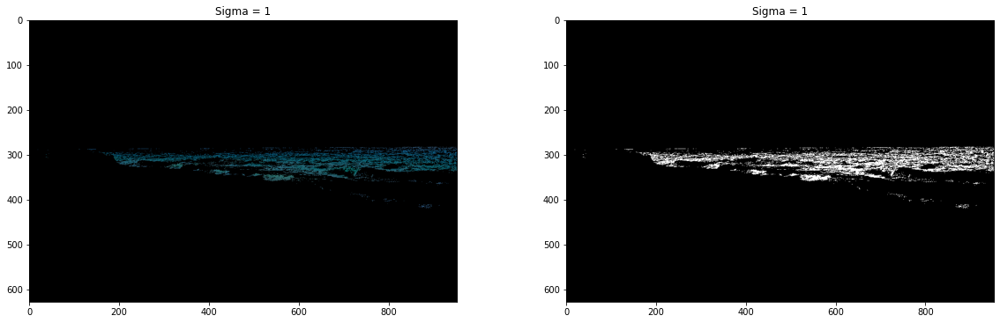

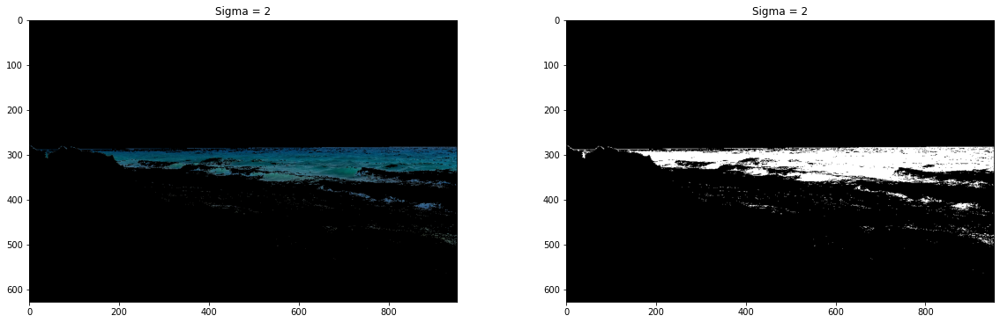

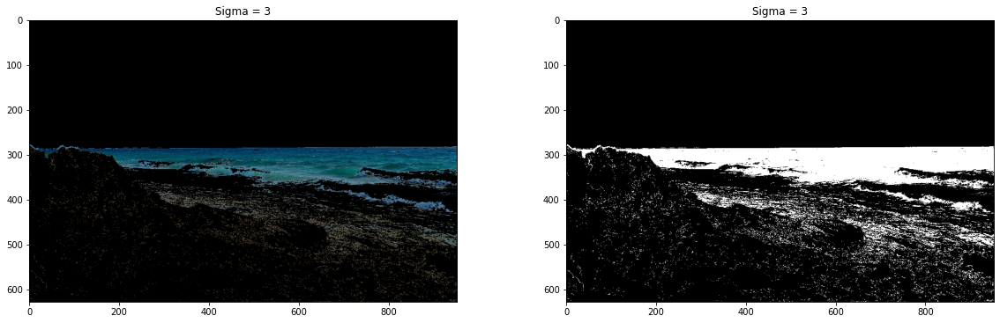

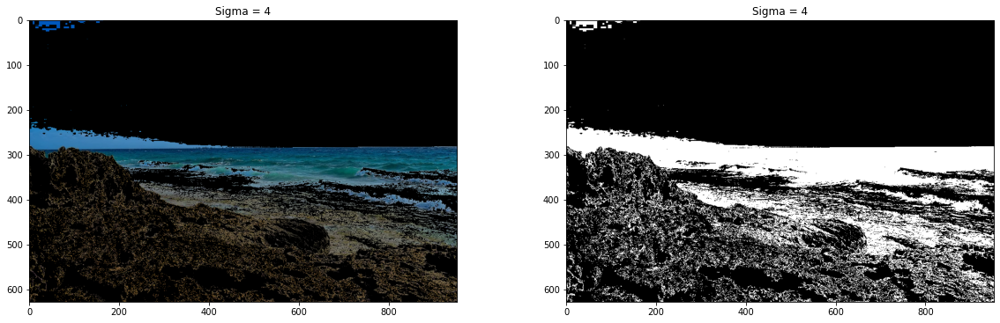

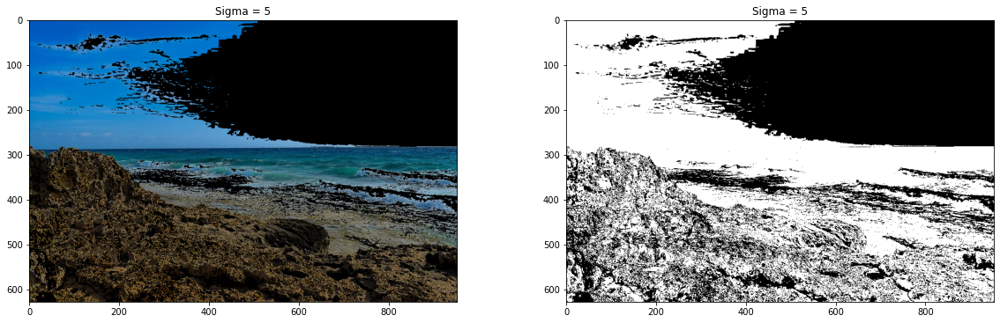

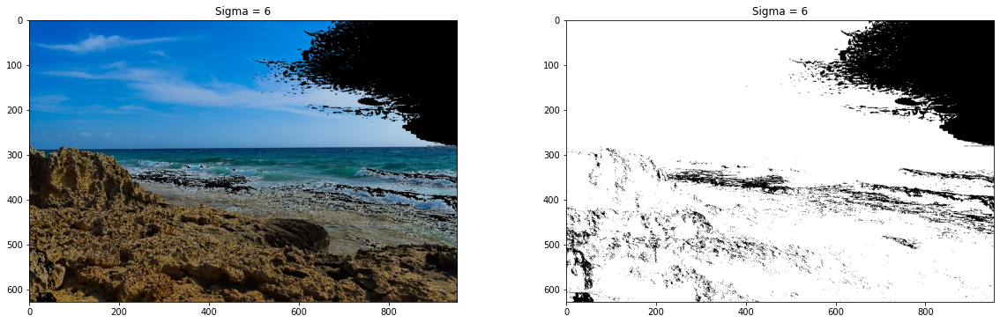

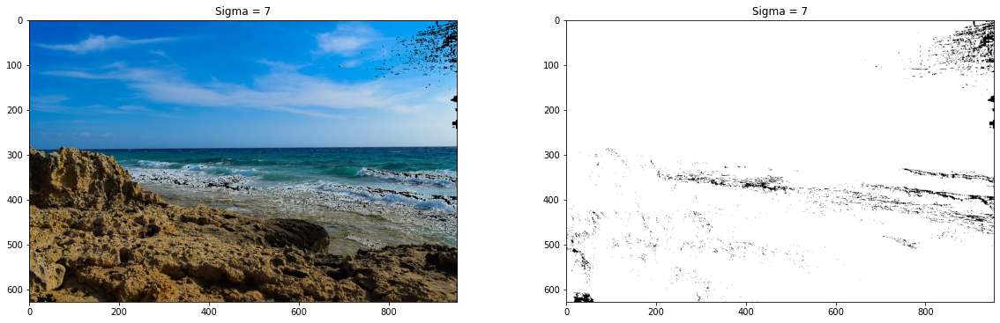

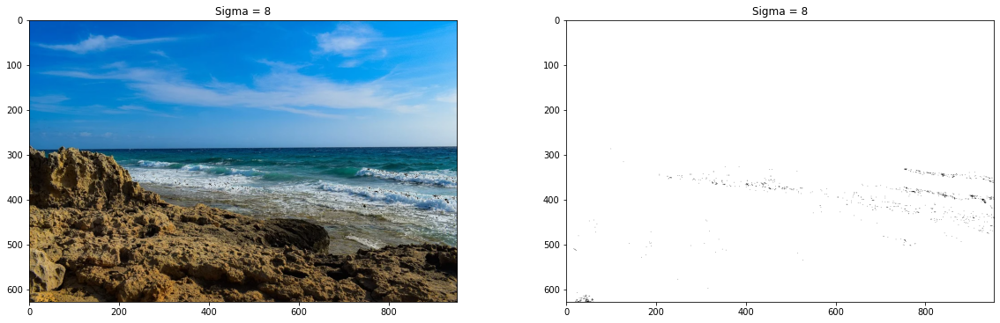

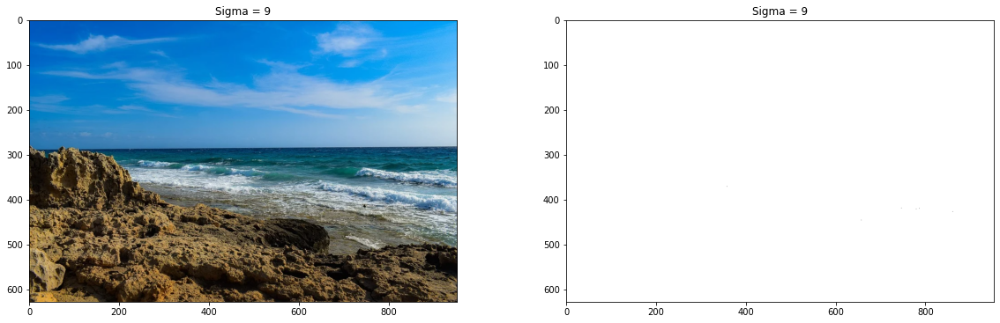

In [110]:
# Segmentacion del agua
# Hacemos un barrido con diferentes sigmas y observamos los resultados
#---------------------------------------------------------------------
for i in range(1,10):
    mask_agua = cv.inRange(imgRGB, agua_mean-agua_std*i,  agua_mean+agua_std*i)
    agua_segmentada = cv.bitwise_and(imgRGB, imgRGB, mask=mask_agua)

    plt.figure(i,figsize=(20,20))
    plt.subplot(3,2,1)
    plt.title("Sigma = {}".format(i))
    plt.imshow(agua_segmentada)
    plt.subplot(3,2,2)
    plt.title("Sigma = {}".format(i))
    plt.imshow(mask_agua,cmap='gray')
    plt.show

Conclusion: claramente, el metodo de segmentacion por modelo estadistico da mejor resultado, en este caso, que a traves de los histogramas por canales, logrando un resultado aceptable